In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [5]:
df = pd.read_csv('train.csv')

In [6]:
df.shape

(42000, 785)

In [17]:
df.sample(5)

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
17756,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19889,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10567,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21680,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30277,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
import matplotlib.pyplot as plt

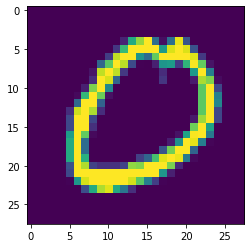

In [9]:
plt.imshow(df.iloc[13051,1:].values.reshape(28,28))

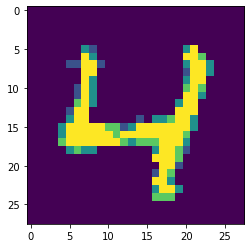

In [42]:
plt.imshow(df.iloc[130,1:].values.reshape(28,28))

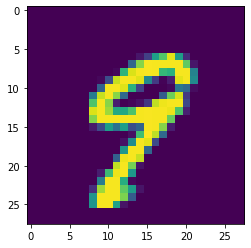

In [43]:
plt.imshow(df.iloc[11,1:].values.reshape(28,28))

In [10]:
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [11]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [12]:
X_train.shape

(33600, 784)

In [13]:
from sklearn.neighbors import KNeighborsClassifier

In [14]:
knn = KNeighborsClassifier()

In [15]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [16]:
import time
start = time.time()
y_pred = knn.predict(X_test)
print(time.time() - start)

39.17504262924194


In [18]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

In [19]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [20]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [21]:
# PCA 
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [22]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [23]:
X_train_trf.shape

(33600, 200)

In [24]:
knn = KNeighborsClassifier()

In [25]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [26]:
y_pred = knn.predict(X_test_trf)

In [27]:
accuracy_score(y_test,y_pred)

0.9508333333333333

In [ ]:
for i in range(1,785):
    pca = PCA(n_components=i)
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)
    
    knn = KNeighborsClassifier()
    
    knn.fit(X_train_trf,y_train)
    
    y_pred = knn.predict(X_test_trf)
    
    print(accuracy_score(y_test,y_pred))
    

In [28]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [29]:
X_train_trf

array([[-2.71868317, -0.49048348],
       [-0.67684817, -6.75225502],
       [-3.03313695,  6.51056415],
       ...,
       [ 2.14898762,  0.78127247],
       [ 1.05943916,  0.94670356],
       [17.7025256 ,  1.96166057]])

In [30]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [31]:
# transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [32]:
X_train_trf

array([[-2.71859982, -0.48999257,  1.13603363],
       [-0.67707964, -6.75334716, -2.33742708],
       [-3.03324814,  6.50974519,  7.49130798],
       ...,
       [ 2.14885997,  0.78109011, -0.74716281],
       [ 1.05960166,  0.94749956,  3.95011735],
       [17.70257645,  1.96157476, -4.9435402 ]])

In [33]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [34]:
pca.explained_variance_
# Eigen values

array([40.67111197, 29.17023388, 26.74459452])

In [35]:
pca.components_.shape
# Eigen vectors

(3, 784)

In [36]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [37]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [38]:
pca.explained_variance_.shape

(784,)

In [39]:
pca.components_.shape

(784, 784)

In [40]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

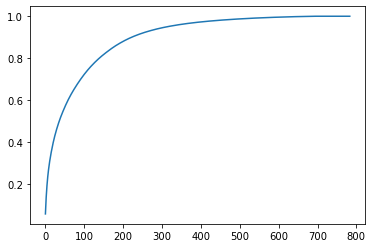

In [41]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))